In [4]:
from ckiptagger import data_utils, construct_dictionary, WS, POS, NER

ws = WS("./data")
pos = POS("./data")
ner = NER("./data")

D:\anaconda3\lib\site-packages\ckiptagger\model_ws.py:106: UserWarning: `tf.nn.rnn_cell.LSTMCell` is deprecated and will be removed in a future version. This class is equivalent as `tf.keras.layers.LSTMCell`, and will be replaced by that in Tensorflow 2.0.
  cell = tf.compat.v1.nn.rnn_cell.LSTMCell(hidden_d, name=name)
D:\anaconda3\lib\site-packages\ckiptagger\model_pos.py:56: UserWarning: `tf.nn.rnn_cell.LSTMCell` is deprecated and will be removed in a future version. This class is equivalent as `tf.keras.layers.LSTMCell`, and will be replaced by that in Tensorflow 2.0.
  cell = tf.compat.v1.nn.rnn_cell.LSTMCell(hidden_d, name=name)
D:\anaconda3\lib\site-packages\ckiptagger\model_ner.py:57: UserWarning: `tf.nn.rnn_cell.LSTMCell` is deprecated and will be removed in a future version. This class is equivalent as `tf.keras.layers.LSTMCell`, and will be replaced by that in Tensorflow 2.0.
  cell = tf.compat.v1.nn.rnn_cell.LSTMCell(hidden_d, name=name)


In [52]:
import re
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
from itertools import chain
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib

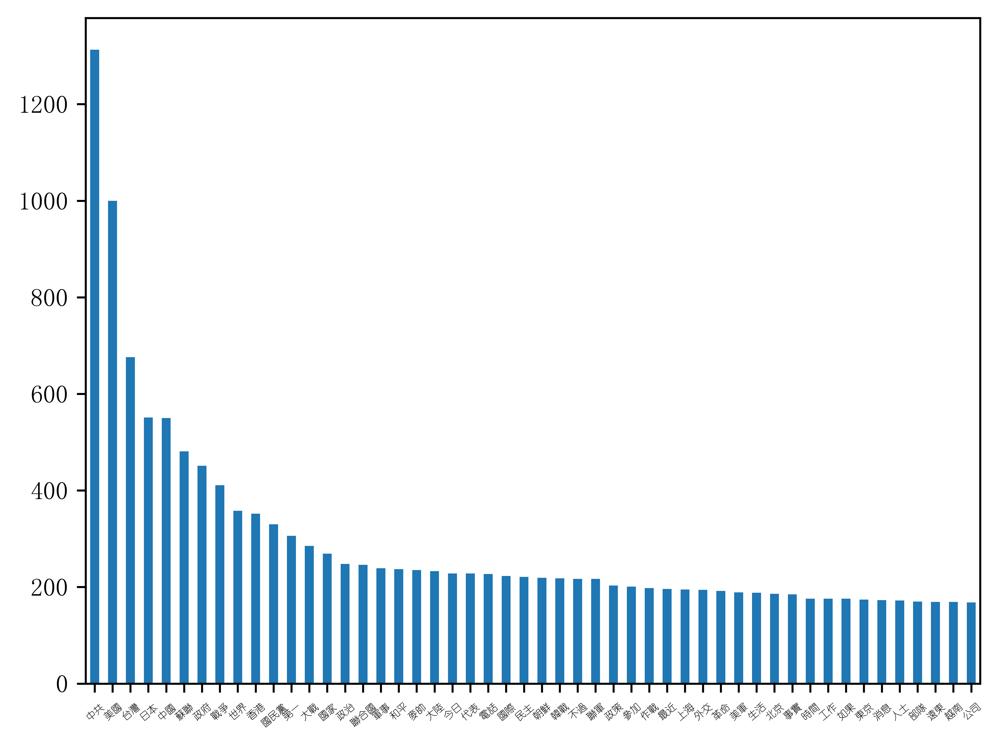

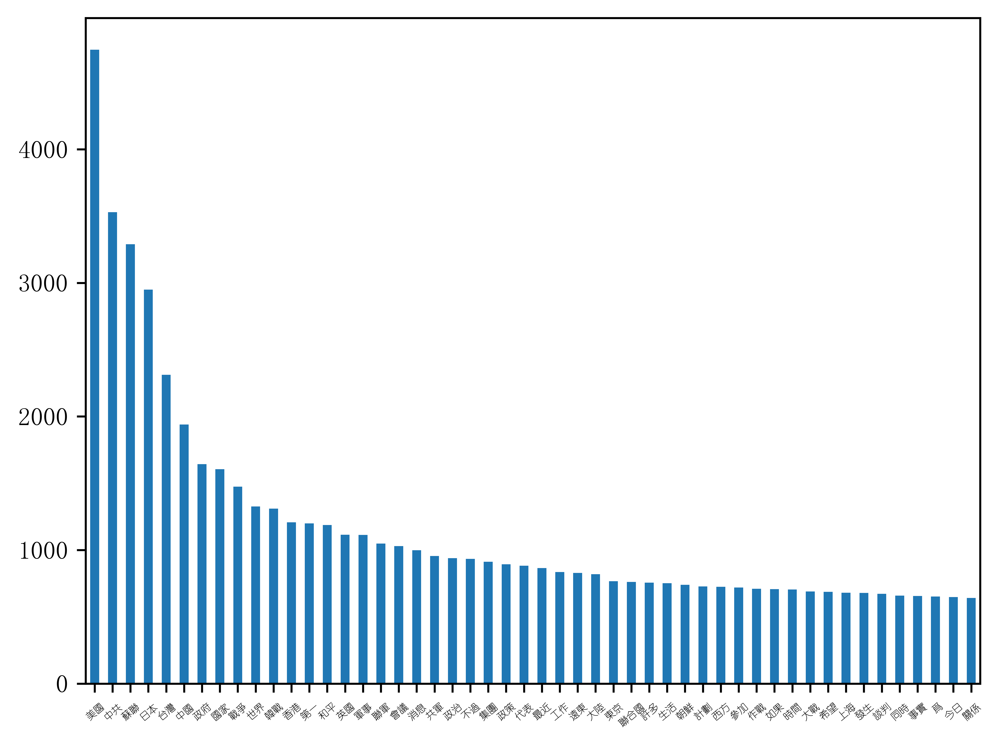

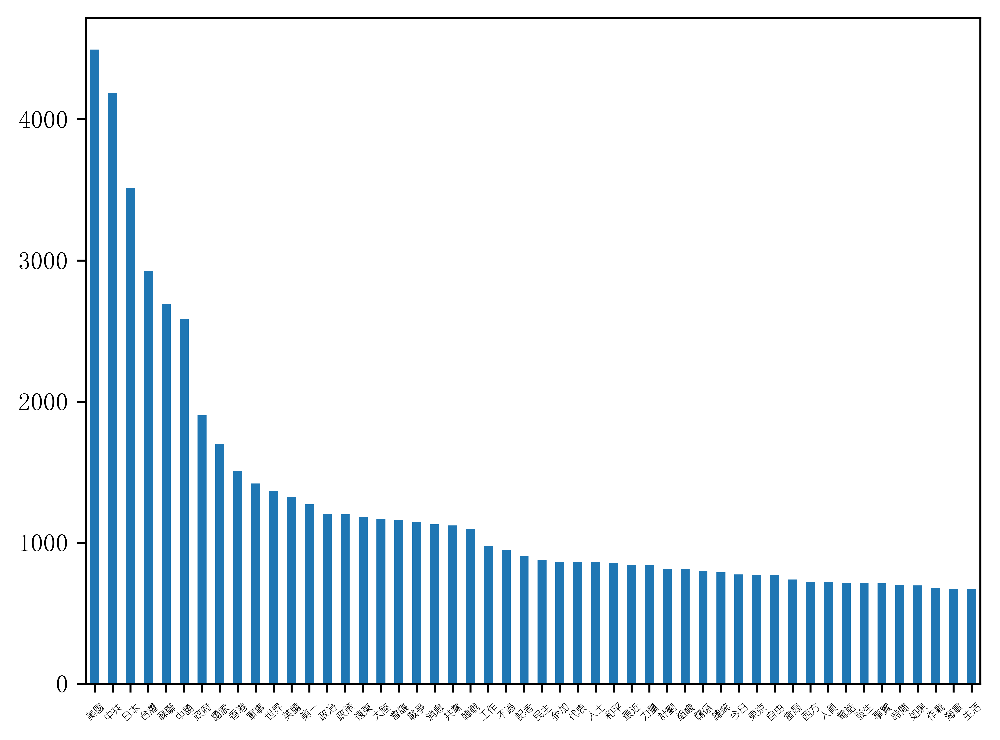

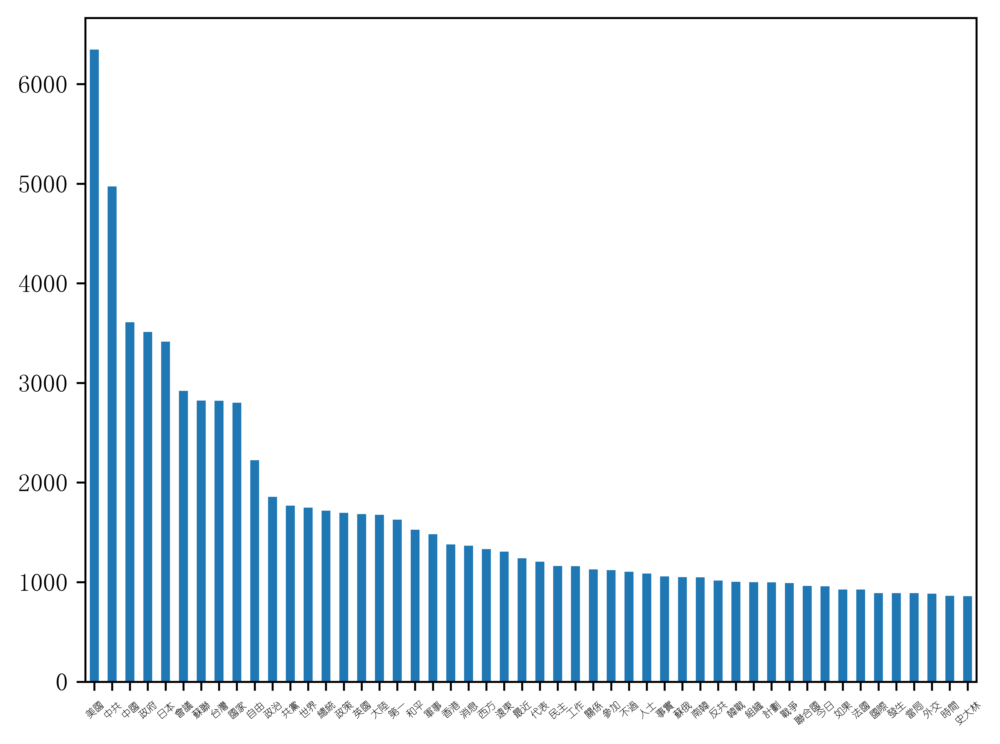

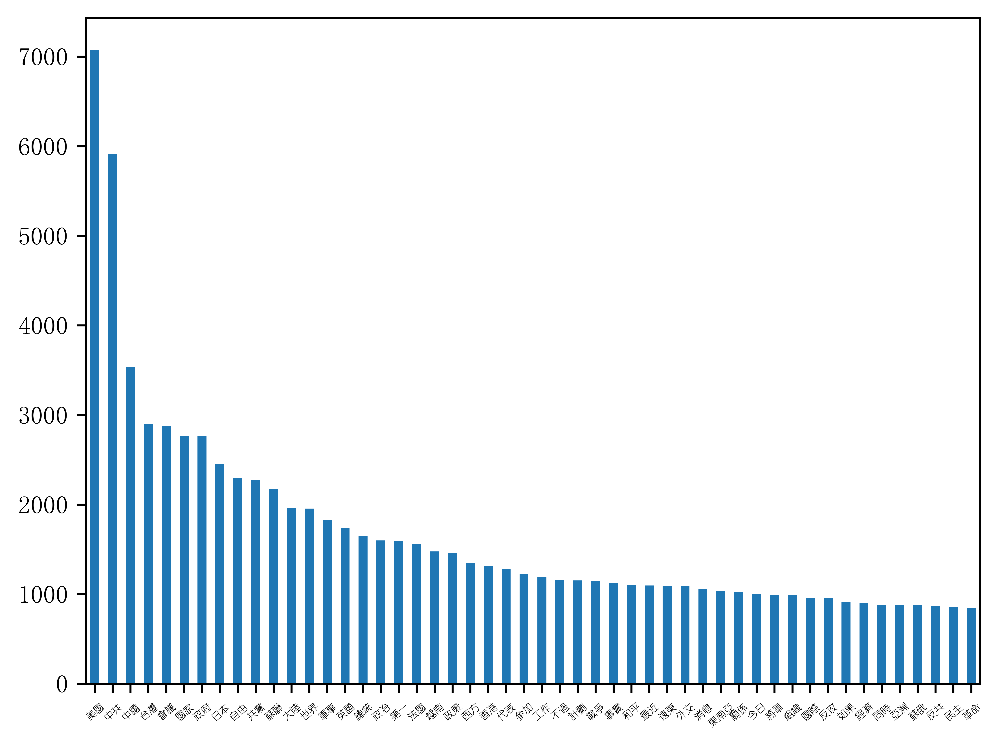

...

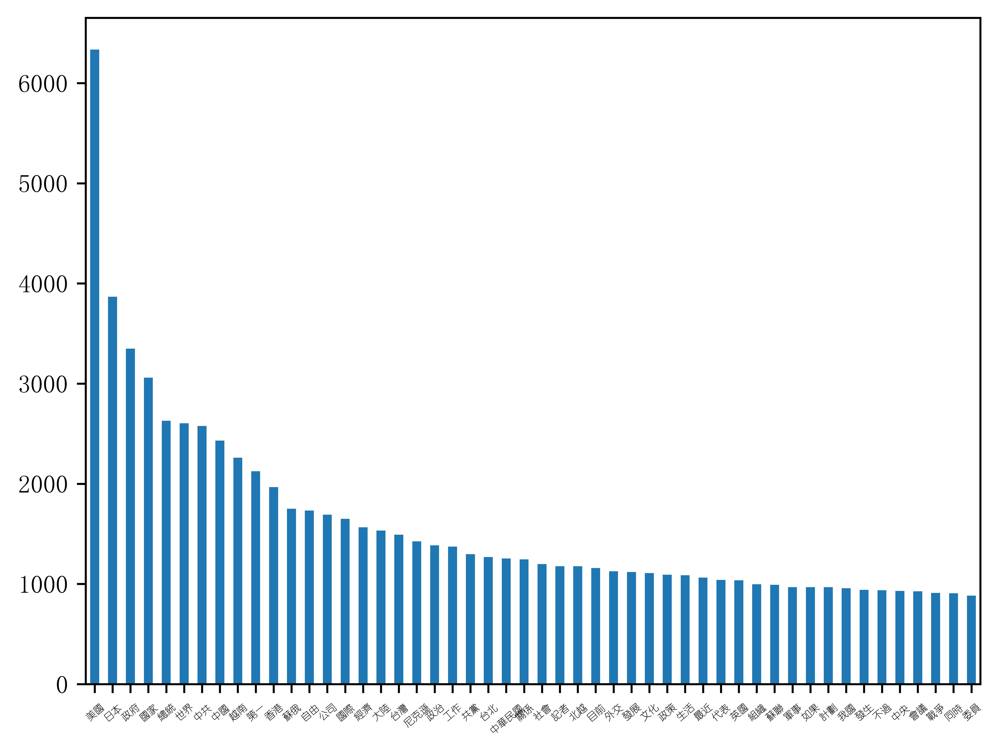

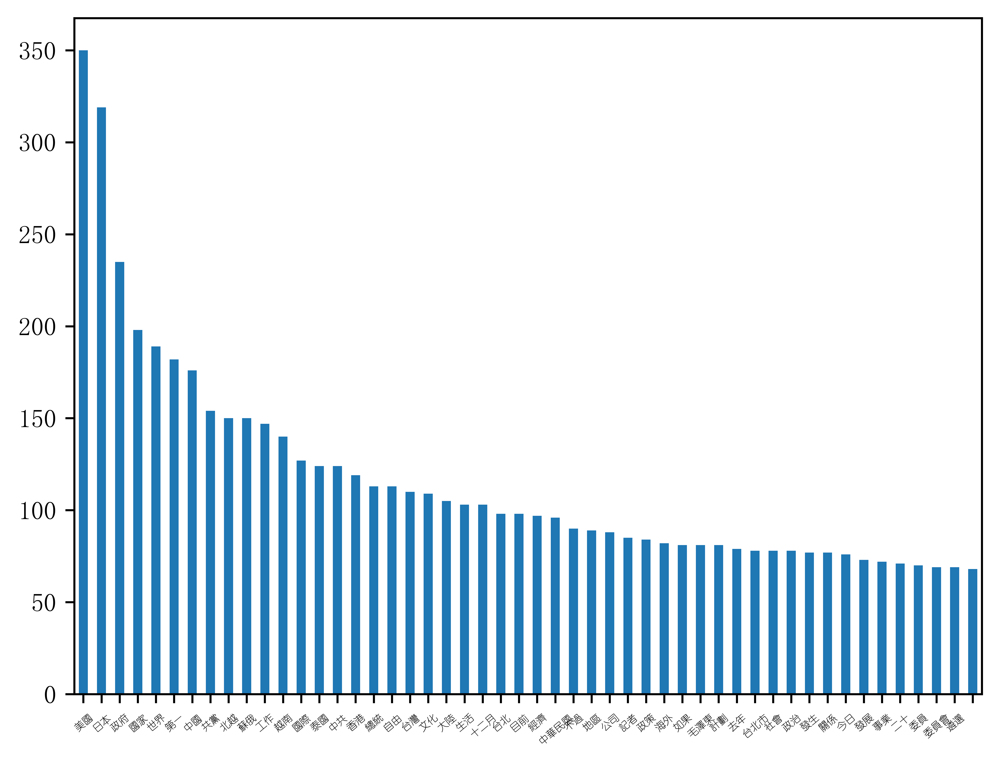

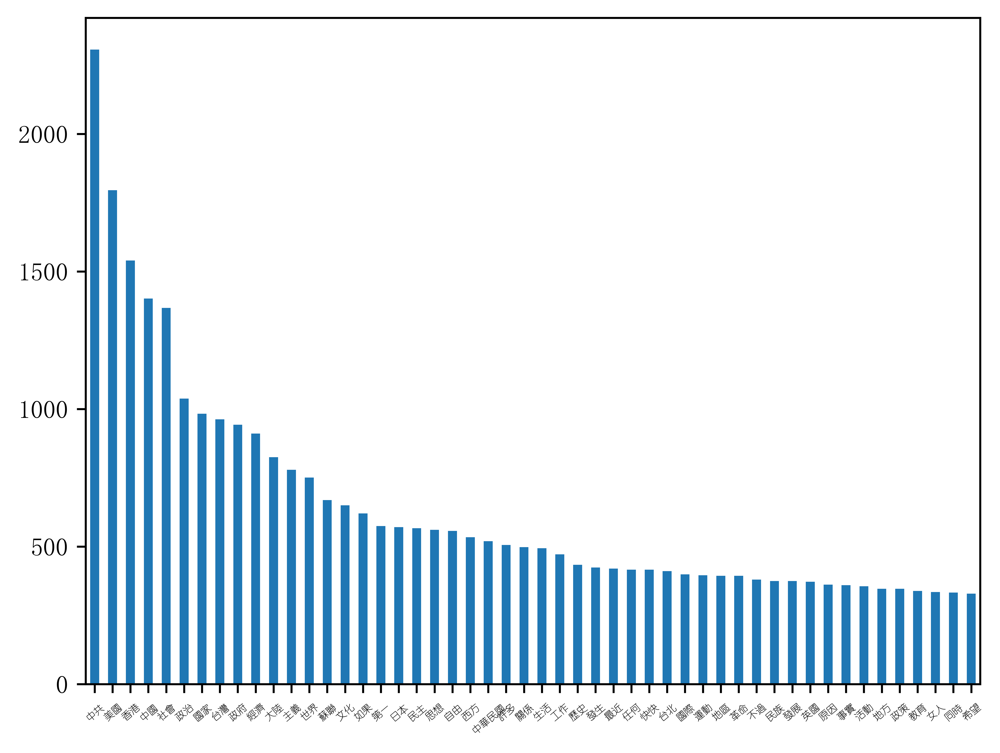

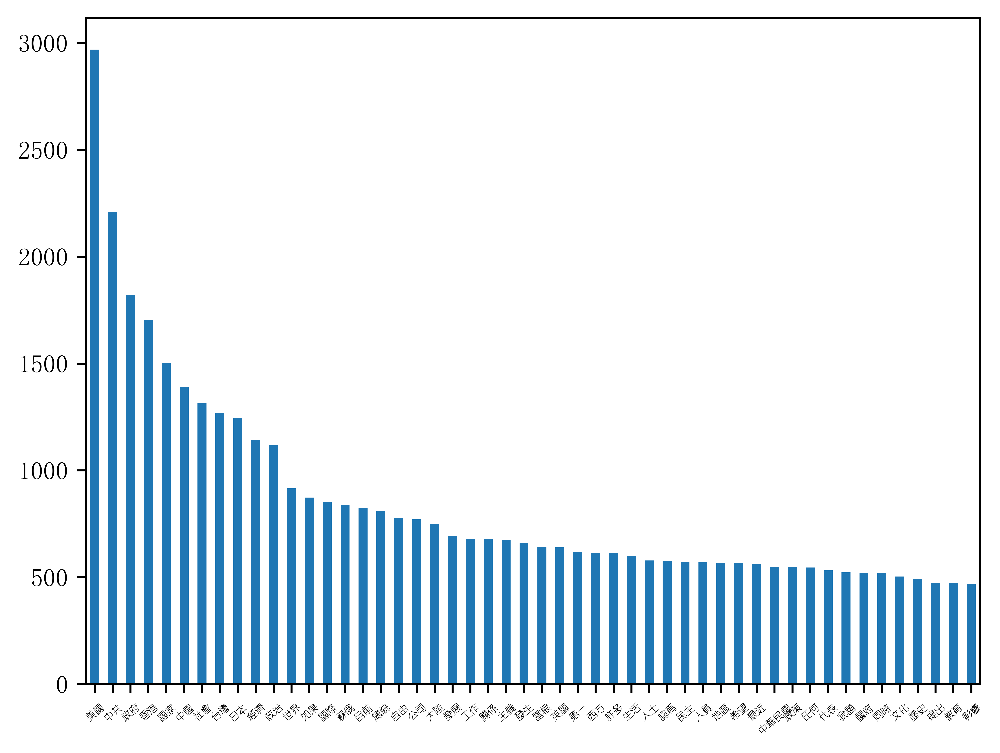

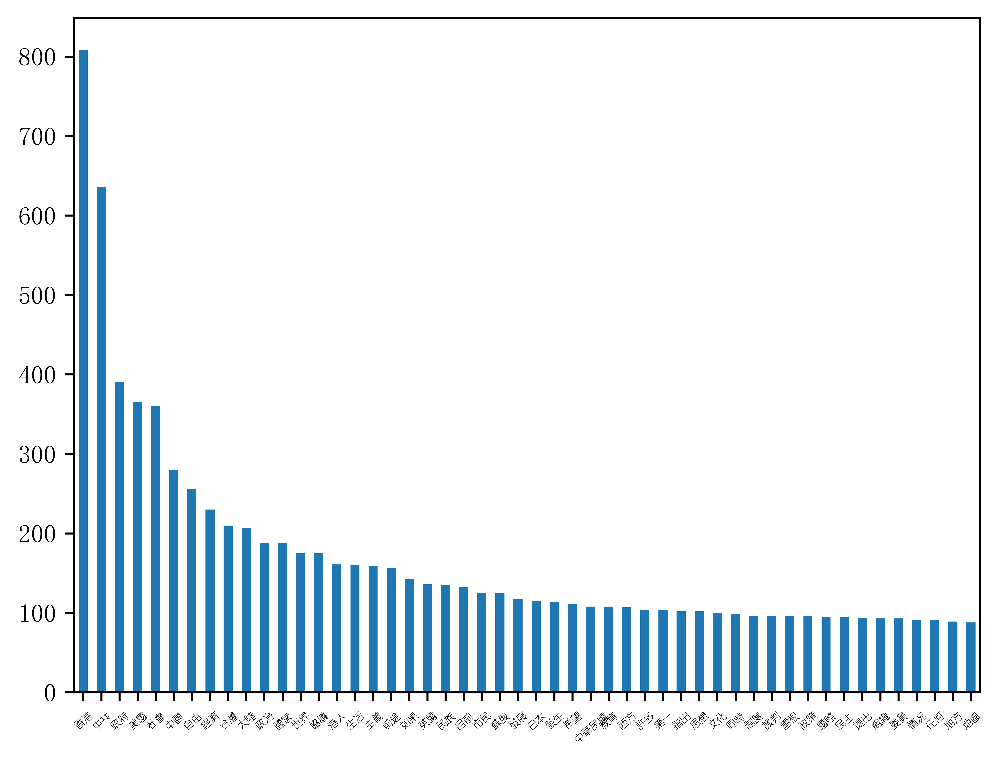

In [53]:

year = 1950

while year < 1986:
    try:
        # test.txt 是我们需要读入的繁体文本，如果遇到无法解码的错误，用errors跳过
        f = open('./twt_text/'+str(year)+'.txt', encoding='utf-8', errors="ignore")
    except:
        year += 1
        continue




    sentences = ''
    for line in f.readlines():
        line = re.sub('\n','',line)  #去掉列表中每一个元素的换行符
        line = re.sub('[a-zA-Z0-9]','',line) #去掉数字，字母
        sentences += line

    sentence_list = re.split(r'[，,。.]', sentences) #获得句子的list

    f.close()

    word_sentence_list = ws(
        sentence_list,
    )


    word_list = list(chain.from_iterable(word_sentence_list))


    # 移除停留詞
    def remove_stop_words(file_name,seg_list):
      with open(file_name,encoding='utf-8') as f:
        stop_words = f.readlines()
      stop_words = [stop_word.rstrip() for stop_word in stop_words]
      new_list = []
      for seg in seg_list:
        if seg not in stop_words:
          new_list.append(seg) #若在for loop裡用remove的話則會改變總長度
      return new_list
    file_name = './stop_words.txt'
    seg_list = remove_stop_words(file_name,word_list)


    # 分词后用空格隔开每个单词
    word_list = []
    for j in seg_list:
        if len(j) == 1:
            continue
        word_list.append(j)

    freq = pd.Series(word_list).value_counts().head(50)

    matplotlib.rc("font",family='YouYuan')
    freq.plot(kind = 'bar')
    plt.rcParams['savefig.dpi'] = 600 #图片像素
    plt.rcParams['figure.dpi'] = 1000 #分辨率
    plt.xticks(size = 4,rotation = 40)  # x轴标签旋转
    plt.savefig('./tianwentai_freq/'+str(year)+'.png')
    plt.show() # 图1
    year += 1


